In [11]:
import numpy as np 
import pandas as pd 
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn
import torch.optim.adam
import seaborn as sns
import sklearn
from sklearn.metrics import mean_squared_error
import os
import plotly.express as px
import statsmodels.api as sm

train_data = pd.read_csv('Data/train.csv')
oil = pd.read_csv('Data/oil.csv')
stores = pd.read_csv('Data/stores.csv')
holiday_event = pd.read_csv('Data/holidays_events.csv')
testdata = pd.read_csv('Data/test.csv')
trans = pd.read_csv('Data/transactions.csv')
sample_submission = pd.read_csv('Data/sample_submission.csv')


    

RANDOM_SEED = 12
time = np.arange(5*365 + 1 )

In [12]:
def plot_series(time , series , format = "-" , start = 0, end = None , label = None , color = None):
    plt.plot(time[start:end] , series[start:end] , format , label = label , color = color)
    plt.xlabel("Time")
    plt.ylabel("Value")
    if label:
        plt.legend(fontsize = 14)
    plt.grid(True)

def trend(time , slope = 0 ):
    return slope * time

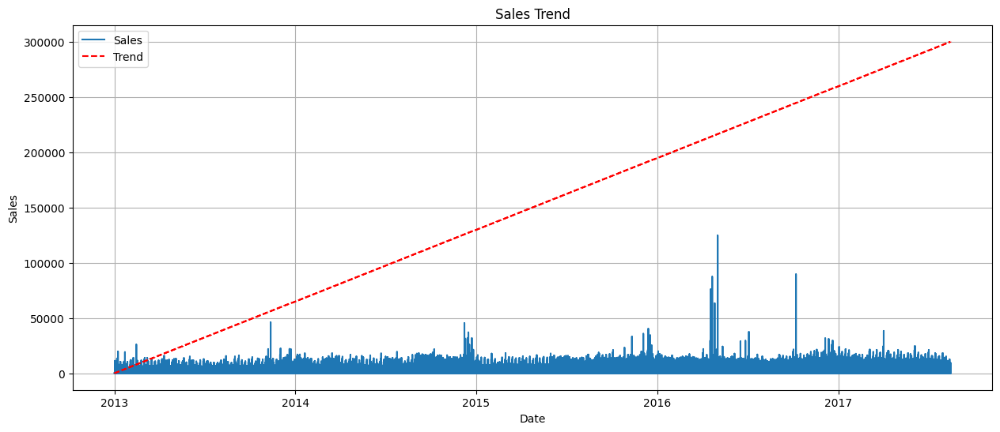

In [13]:
import pandas as pd
import matplotlib.pyplot as plt


sales_data = pd.read_csv("Data/train.csv", parse_dates=["date"])

def trend(time, slope=0):
    return slope * time


sales_data["time"] = range(len(sales_data))
slope = 0.1  
sales_data["trend"] = trend(sales_data["time"], slope)

plt.figure(figsize=(15, 6))
plt.plot(sales_data["date"], sales_data["sales"], label="Sales")
plt.plot(sales_data["date"], sales_data["trend"], label="Trend", linestyle="--", color="red")
plt.xlabel("Date")
plt.ylabel("Sales")
plt.title("Sales Trend")
plt.legend()
plt.grid(True)
plt.show()


/tmp/ipykernel_783244/3371839772.py:22: RuntimeWarning: divide by zero encountered in divide
  periods_sales = 1 / freqs_sales


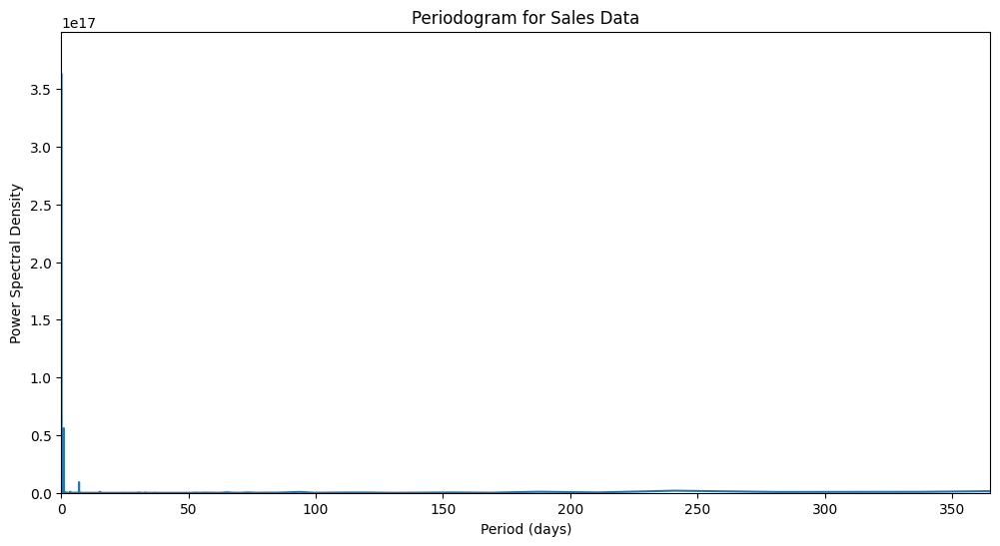

In [16]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Assuming train_data is already loaded as a DataFrame
if len(train_data) < 2:
    raise ValueError("Insufficient data points in the sales data.")

# Convert the 'date' column to datetime format
train_data["date"] = pd.to_datetime(train_data["date"])

# Calculate the time differences and the average interval
time_diff = train_data["date"].diff().dt.days
time_interval = time_diff.mean()

if pd.isnull(time_interval) or time_interval == 0:
    raise ValueError("Invalid time interval calculated.")

# Compute the Periodogram for sales data
psd_sales = np.abs(np.fft.fft(train_data["sales"])) ** 2
freqs_sales = np.fft.fftfreq(len(psd_sales), d=time_interval)
periods_sales = 1 / freqs_sales

# Extract positive frequencies
positive_freqs_sales = freqs_sales > 0
positive_periods_sales = periods_sales[positive_freqs_sales]
positive_psd_sales = psd_sales[positive_freqs_sales]

# Plot the periodogram
plt.figure(figsize=(12, 6))
plt.plot(positive_periods_sales, positive_psd_sales)
plt.title('Periodogram for Sales Data')
plt.xlabel('Period (days)')
plt.ylabel('Power Spectral Density')
plt.xlim(0, 365)  # Focus on periods up to a year
plt.ylim(0, np.max(positive_psd_sales) * 1.1)  # Add some padding to the y-axis
plt.show()


In [17]:
import sys
!{sys.executable} -m pip install --upgrade nbformat>=4.2.0






[notice] A new release of pip is available: 24.0 -> 24.3.1
[notice] To update, run: pip3.12 install --upgrade pip


In [19]:
train_data = pd.read_csv('Data/train.csv')
oil = pd.read_csv('Data/oil.csv')
stores = pd.read_csv('Data/stores.csv')
holiday_event = pd.read_csv('Data/holidays_events.csv')
testdata = pd.read_csv('Data/test.csv')
trans = pd.read_csv('Data/transactions.csv')
sample_submission = pd.read_csv('Data/sample_submission.csv')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1218 entries, 0 to 1217
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   date    1218 non-null   object 
 1   Prices  1175 non-null   float64
dtypes: float64(1), object(1)
memory usage: 19.2+ KB


<Axes: xlabel='date'>

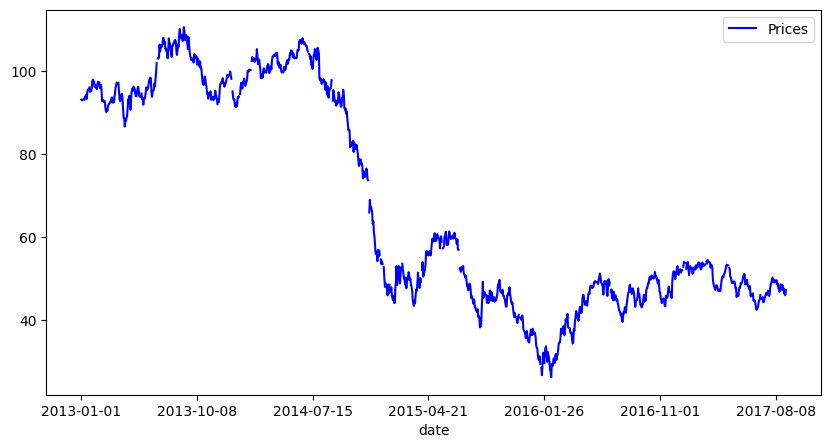

In [20]:
oil1=oil.rename(columns={"dcoilwtico":"Prices"})
oil1.info() 
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(10,5))
oil1.plot.line(x="date", y="Prices", color="b", ax=axes, rot=0)

In [21]:
holiday_event.loc[holiday_event.type=="Transfer", "description"] = holiday_event.loc[holiday_event.type == "Transfer", "description"].str.replace("Translado", "") 
holiday_event['type'].replace("Transfer", "Normal", inplace = True)
holiday_event.describe

/tmp/ipykernel_783244/4173888584.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  holiday_event['type'].replace("Transfer", "Normal", inplace = True)


<bound method NDFrame.describe of            date        type    locale locale_name  \
0    2012-03-02     Holiday     Local       Manta   
1    2012-04-01     Holiday  Regional    Cotopaxi   
2    2012-04-12     Holiday     Local      Cuenca   
3    2012-04-14     Holiday     Local    Libertad   
4    2012-04-21     Holiday     Local    Riobamba   
..          ...         ...       ...         ...   
345  2017-12-22  Additional  National     Ecuador   
346  2017-12-23  Additional  National     Ecuador   
347  2017-12-24  Additional  National     Ecuador   
348  2017-12-25     Holiday  National     Ecuador   
349  2017-12-26  Additional  National     Ecuador   

                       description  transferred  
0               Fundacion de Manta        False  
1    Provincializacion de Cotopaxi        False  
2              Fundacion de Cuenca        False  
3        Cantonizacion de Libertad        False  
4        Cantonizacion de Riobamba        False  
..                           

In [22]:
def conv_date(df):
   df['date']=pd.to_datetime(df['date'], format = "%Y-%m-%d")

conv_date(holiday_event)
conv_date(oil1)
conv_date(train_data)
conv_date(testdata)
conv_date(trans)

In [23]:
new_train = train_data.merge(holiday_event, on = 'date', how = 'left')
new_train = new_train.merge(oil1, on = 'date', how = 'left')
new_train = new_train.merge(stores, on = 'store_nbr', how = 'left')
new_train = new_train.merge(trans, on = ['date', 'store_nbr'], how = 'left')

([<matplotlib.patches.Wedge at 0x7a850f1890a0>,
 [Text(-1.0528190266493125, 0.31870377645267145, 'GROCERY I'),
  Text(0.23883189952433162, -1.0737594347755923, 'BEVERAGES'),
  Text(1.0956847437952195, -0.09733931484453837, 'PRODUCE'),
  Text(0.8198281031306878, 0.7334043095845146, 'CLEANING'),
  Text(0.2610106639110985, 1.0685847805975377, 'DAIRY')],
 [Text(-0.5742649236268976, 0.17383842351963893, '40.6%'),
  Text(0.13027194519508994, -0.5856869644230503, '25.7%'),
  Text(0.5976462238883015, -0.053094171733384564, '14.5%'),
  Text(0.44717896534401147, 0.4000387143188261, '11.5%'),
  Text(0.14236945304241735, 0.582864425780475, '7.6%')])

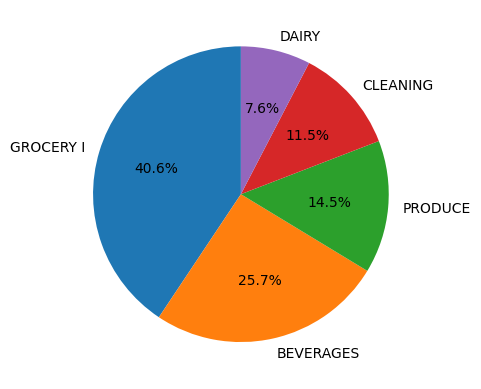

In [24]:
familysales=new_train.groupby('family')['sales'].sum()
family_sales_sorted=familysales.sort_values(ascending=False)
top_families = family_sales_sorted.head(5)
plt.pie(top_families, labels=top_families.index, autopct='%1.1f%%', startangle=90)

/tmp/ipykernel_783244/2974635435.py:3: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  new_train["Prices"] = new_train["Prices"].fillna(method = 'bfill')


,id,date,store_nbr,family,sales,onpromotion,type_x,locale,locale_name,description,transferred,Prices,city,state,type_y,cluster,transactions
561,561,2013-01-01,25,AUTOMOTIVE,0.0,0,Holiday,National,Ecuador,Primer dia del ano,False,93.14,Salinas,Santa Elena,D,1,770.0
562,562,2013-01-01,25,BABY CARE,0.0,0,Holiday,National,Ecuador,Primer dia del ano,False,93.14,Salinas,Santa Elena,D,1,770.0
563,563,2013-01-01,25,BEAUTY,2.0,0,Holiday,National,Ecuador,Primer dia del ano,False,93.14,Salinas,Santa Elena,D,1,770.0
564,564,2013-01-01,25,BEVERAGES,810.0,0,Holiday,National,Ecuador,Primer dia del ano,False,93.14,Salinas,Santa Elena,D,1,770.0
565,565,2013-01-01,25,BOOKS,0.0,0,Holiday,National,Ecuador,Primer dia del ano,False,93.14,Salinas,Santa Elena,D,1,770.0


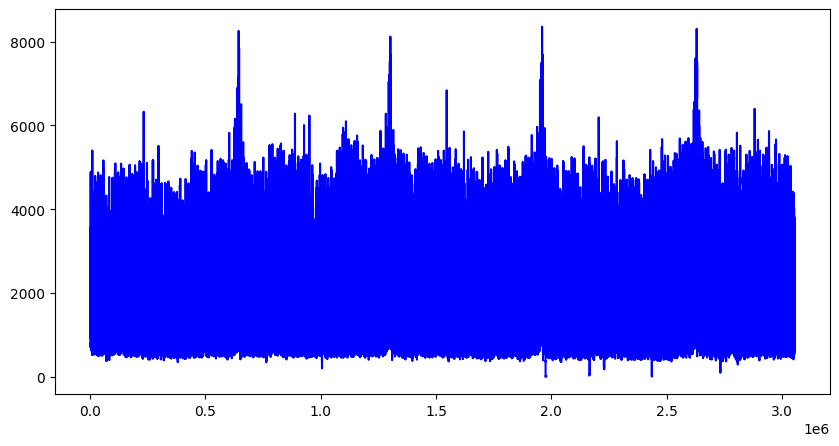

In [25]:
fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(10,5))
new_train['transactions'].plot.line(x="Date", y="Transactions", color="b", ax=axes, rot=0)
new_train["Prices"] = new_train["Prices"].fillna(method = 'bfill')
new_train = new_train[new_train["transactions"].isnull() == False]
new_train.head()

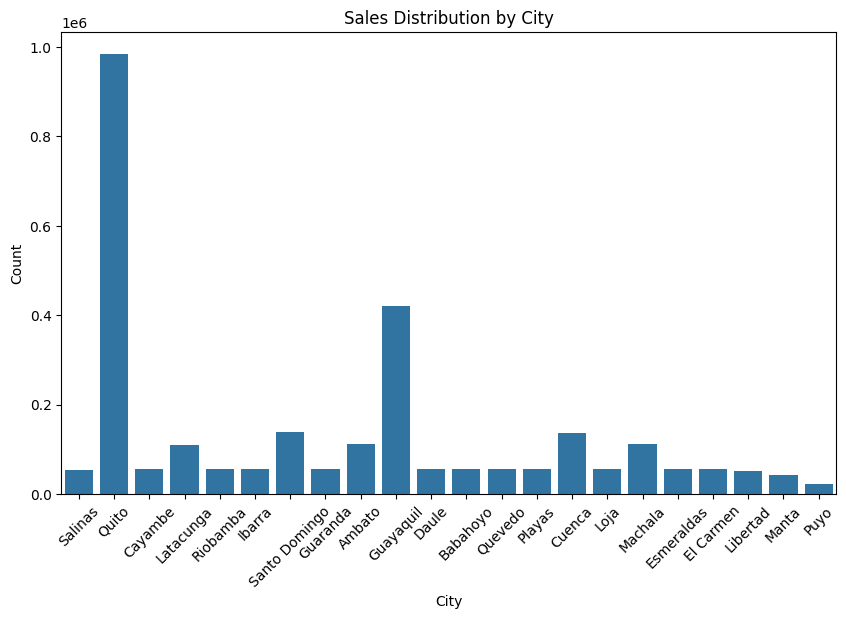

In [26]:
plt.figure(figsize=(10, 6)) 
sns.countplot(data=new_train, x='city') 
plt.xlabel('City')
plt.ylabel('Count')
plt.title('Sales Distribution by City')
plt.xticks(rotation=45)
plt.show()

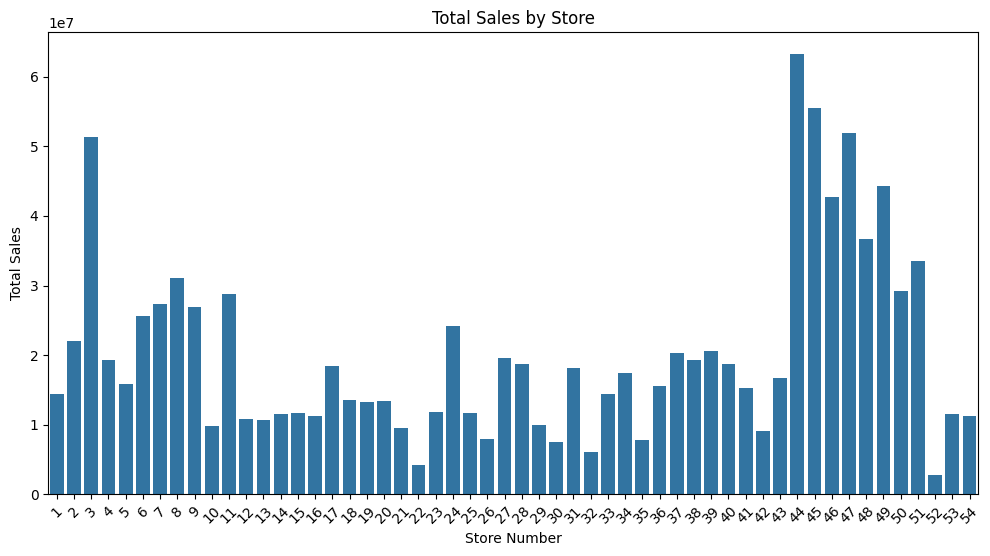

In [27]:


store_sales = new_train.groupby('store_nbr')['sales'].sum().reset_index()
store_sales = store_sales.sort_values('sales', ascending=False)
plt.figure(figsize=(12, 6))
sns.barplot(data=store_sales, x='store_nbr', y='sales')
plt.xlabel('Store Number')
plt.ylabel('Total Sales')
plt.title('Total Sales by Store')
plt.xticks(rotation=45)
plt.show()

In [28]:
new_train=new_train.rename(columns={'type_x':"holiday_type",'type_y':'store_type'})
new_train['holiday_type'] = new_train['holiday_type'].replace({np.nan : "Normal"})

new_train.head()

,id,date,store_nbr,family,sales,onpromotion,holiday_type,locale,locale_name,description,transferred,Prices,city,state,store_type,cluster,transactions
561,561,2013-01-01,25,AUTOMOTIVE,0.0,0,Holiday,National,Ecuador,Primer dia del ano,False,93.14,Salinas,Santa Elena,D,1,770.0
562,562,2013-01-01,25,BABY CARE,0.0,0,Holiday,National,Ecuador,Primer dia del ano,False,93.14,Salinas,Santa Elena,D,1,770.0
563,563,2013-01-01,25,BEAUTY,2.0,0,Holiday,National,Ecuador,Primer dia del ano,False,93.14,Salinas,Santa Elena,D,1,770.0
564,564,2013-01-01,25,BEVERAGES,810.0,0,Holiday,National,Ecuador,Primer dia del ano,False,93.14,Salinas,Santa Elena,D,1,770.0
565,565,2013-01-01,25,BOOKS,0.0,0,Holiday,National,Ecuador,Primer dia del ano,False,93.14,Salinas,Santa Elena,D,1,770.0


In [29]:
new_train=new_train.drop(['locale_name','description','transferred'],axis=1)
new_train=new_train.drop(['locale','family','city','state','cluster','store_type'],axis=1)

new_train.head()

,id,date,store_nbr,sales,onpromotion,holiday_type,Prices,transactions
561,561,2013-01-01,25,0.0,0,Holiday,93.14,770.0
562,562,2013-01-01,25,0.0,0,Holiday,93.14,770.0
563,563,2013-01-01,25,2.0,0,Holiday,93.14,770.0
564,564,2013-01-01,25,810.0,0,Holiday,93.14,770.0
565,565,2013-01-01,25,0.0,0,Holiday,93.14,770.0


In [30]:
new_train.isnull().sum() 
new_train['holiday_type'].unique()

array(['Holiday', 'Normal', 'Work Day', 'Additional', 'Event', 'Bridge'],
      dtype=object)

In [31]:

from sklearn.preprocessing import OneHotEncoder
column = ["holiday_type"] 
object2 = OneHotEncoder(handle_unknown = "ignore", sparse_output = False) 
low_card_df = pd.DataFrame(object2.fit_transform(new_train[column]))
low_card_df.index = new_train.index 
df_encoded = pd.concat([new_train.drop(column, axis = 1), low_card_df], axis=1)
df_encoded.head()

,id,date,store_nbr,sales,onpromotion,Prices,transactions,0,1,2,3,4,5
561,561,2013-01-01,25,0.0,0,93.14,770.0,0.0,0.0,0.0,1.0,0.0,0.0
562,562,2013-01-01,25,0.0,0,93.14,770.0,0.0,0.0,0.0,1.0,0.0,0.0
563,563,2013-01-01,25,2.0,0,93.14,770.0,0.0,0.0,0.0,1.0,0.0,0.0
564,564,2013-01-01,25,810.0,0,93.14,770.0,0.0,0.0,0.0,1.0,0.0,0.0
565,565,2013-01-01,25,0.0,0,93.14,770.0,0.0,0.0,0.0,1.0,0.0,0.0


In [32]:
temp = pd.merge(new_train.groupby(["date", "store_nbr"]).sales.sum().reset_index(), trans, how = "left")
print("Spearman Correlation between Total Sales and Transactions: {:,.4f}".format(temp.corr("spearman").sales.loc["transactions"]))
px.line(trans.sort_values(["store_nbr", "date"]), x='date', y='transactions', color='store_nbr',title = "Transactions" )

Spearman Correlation between Total Sales and Transactions: 0.8095


In [33]:
a = trans.copy()
a["year"] = a.date.dt.year
a["month"] = a.date.dt.month
px.box(a, x="year", y="transactions" , color = "month", title = "Transactions")


In [34]:
a = trans.copy()
a["year"] = a.date.dt.year
a["dayofweek"] = a.date.dt.dayofweek+1
a = a.groupby(["year", "dayofweek"]).transactions.mean().reset_index()
px.line(a, x="dayofweek", y="transactions" , color = "year", title = "Transactions")